In [1]:
import pytorch_lightning as pl

# set cwd to the root of the project to make sure we can import the modules
import os

os.chdir(os.path.dirname(os.getcwd()))
print(os.getcwd())

from ellipse_rcnn import EllipseRCNN
from ellipse_rcnn.core.model import EllipseRCNNLightning

model = EllipseRCNN()
pl_model = EllipseRCNNLightning(model)

/Users/filipstrozik/Documents/studies/IISEM/sat-trees-detection


In [2]:
# from datasets import load_dataset

# ds = load_dataset("Filipstrozik/satellite_trees_wroclaw_2022")

In [3]:
from datasets import load_from_disk

path = "../spatial-data/dataset/trees_dataset"
ds = load_from_disk(path)

/Users/filipstrozik/Documents/studies/IISEM/sat-trees-detection/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
ds

Dataset({
    features: ['images', 'metadata', 'results'],
    num_rows: 16880
})

In [5]:
# ds[2]["metadata"]["transformed_trees"]

In [6]:
img = ds[2]["images"]
import torchvision.transforms as T

transform = T.Compose([T.PILToTensor()])


tensor = transform(img)

tensor.shape

torch.Size([3, 1024, 1024])

In [7]:
import torch
from torch.utils.data import Dataset
from PIL import Image
import torchvision.transforms as T
import json
import numpy as np
import torchvision
from typing import Any

from ellipse_rcnn.utils import data
from ellipse_rcnn.utils.types import TargetDict, ImageTargetTuple, EllipseTuple
from ellipse_rcnn.utils.conics import (
    bbox_ellipse,
    ellipse_to_conic_matrix,
    conic_center,
    unimodular_matrix,
)
from ellipse_rcnn.utils.data.base import EllipseDatasetBase, collate_fn
from torch.utils.data import DataLoader, random_split


class Trees(Dataset):
    def __init__(self, hf_dataset, transform=None):
        self.dataset = hf_dataset
        if transform is None:
            self.transform = torchvision.transforms.Compose(
                [
                    torchvision.transforms.PILToTensor(),
                    torchvision.transforms.ConvertImageDtype(torch.float),
                    torchvision.transforms.Normalize(
                        mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]
                    ),
                ]
            )
        else:
            self.transform = transform

    def __len__(self):
        return len(self.dataset)

    def get_target(self, idx):

        # (x,y,r)
        circles_list = self.dataset[idx]["metadata"]["transformed_trees"]

        # convert circles_list to ellipse_list
        ellipses_list = []
        for circle in circles_list:
            # circle is a jsob object with keys x, y, r, lat, lon
            ellipse = {
                "x": circle["x"],
                "y": circle["y"],
                "theta": 0,
                "a": circle["radius"],
                "b": circle["radius"],
            }
            ellipses_list.append(ellipse)

        a = torch.tensor([[e["a"] for e in ellipses_list]])
        b = torch.tensor([[e["b"] for e in ellipses_list]])
        theta = torch.tensor([[e["theta"] for e in ellipses_list]])
        x = torch.tensor([[e["x"] for e in ellipses_list]])
        y = torch.tensor([[e["y"] for e in ellipses_list]])

        ellipse_matrices = ellipse_to_conic_matrix(a=a, b=b, x=x, y=y, theta=theta)

        if torch.stack(conic_center(ellipse_matrices)).isnan().any():
            raise ValueError("NaN values in ellipse matrices. Please check the data.")

        if len(ellipse_matrices.shape) == 2:
            ellipse_matrices = ellipse_matrices.unsqueeze(0)

        boxes = bbox_ellipse(ellipse_matrices, box_type="xyxy")

        num_objs = len(boxes)

        labels = torch.ones((num_objs,), dtype=torch.int64)
        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        target = TargetDict(
            boxes=boxes,
            labels=labels,
            image_id=image_id,
            area=area,
            iscrowd=iscrowd,
            ellipse_matrices=ellipse_matrices,
        )

        return target

    def __getitem__(self, idx):
        # Pobranie przykładu z datasetu Hugging Face
        example = self.dataset[idx]

        # Załadowanie obrazka
        image = example["images"]

        # Transformacja obrazka
        image = self.transform(image)

        # Pobranie targetu
        target = self.get_target(idx)

        return image, target


class TreesLightningDataModule(pl.LightningDataModule):
    def __init__(
        self,
        data,
        batch_size: int = 16,
        train_fraction: float = 0.8,
        transform: Any = None,
        num_workers: int = 0,
    ) -> None:
        super().__init__()
        self.data = data
        self.batch_size = batch_size
        self.train_fraction = train_fraction
        self.transform = transform
        self.dataset: Trees | None = None
        self.train_dataset = None
        self.val_dataset = None
        self.num_workers = num_workers

    def prepare_data(self) -> None:
        # Ensure data preparation or downloading is done here.
        pass

    def setup(self, stage: str | None = None) -> None:
        # Instantiate the Trees dataset and split it into training and validation subsets.
        self.dataset = Trees(self.data, transform=self.transform)

        train_size = int(len(self.dataset) * self.train_fraction)
        val_size = len(self.dataset) - train_size
        self.train_dataset, self.val_dataset = random_split(
            self.dataset, [train_size, val_size]
        )

    def train_dataloader(self) -> DataLoader[ImageTargetTuple]:
        return DataLoader(
            self.train_dataset,
            batch_size=self.batch_size,
            shuffle=True,
            collate_fn=collate_fn,
            num_workers=self.num_workers,
        )

    def val_dataloader(self) -> DataLoader[ImageTargetTuple]:
        return DataLoader(
            self.val_dataset,
            batch_size=self.batch_size,
            collate_fn=collate_fn,
            num_workers=self.num_workers,
        )

    def test_dataloader(self) -> DataLoader[ImageTargetTuple]:
        # Placeholder for test data; currently returns the validation dataloader as a default.
        return DataLoader(
            self.val_dataset,
            batch_size=self.batch_size,
            collate_fn=collate_fn,
            num_workers=self.num_workers,
        )

In [8]:
img = torch.randn(3, 224, 224)

# Extract the height and width
val = img.shape[-2:]

print(val)

torch.Size([224, 224])


In [14]:
from pytorch_lightning import Trainer
from pytorch_lightning import LightningDataModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.callbacks import ModelCheckpoint

# Initialize the model
model = EllipseRCNN()

# Initialize the Lightning Data Module
data_module = TreesLightningDataModule(
    data=ds,
    batch_size=16,
    train_fraction=0.8,
    num_workers=0,
)
# Prepare and set up the data
# data_module.prepare_data()
data_module.setup()

pl_model = EllipseRCNNLightning(model)

# mps accelerator
accelerator = "mps"
if torch.cuda.is_available():
    accelerator = "cuda"
elif torch.backends.mps.is_available():
    accelerator = "mps"
else:
    accelerator = "cpu"


# Initialize the Trainer
checkpoint_callback = ModelCheckpoint(
    monitor="val/loss_total",
    dirpath="checkpoints",
    filename=r"loss={val/loss_total:.5f}-e={epoch:02d}",
    auto_insert_metric_name=False,
    save_top_k=1,
    mode="min",
)
early_stopping_callback = EarlyStopping(
    monitor="val/loss_total",
    patience=5,
    mode="min",
)
trainer = pl.Trainer(
    accelerator=accelerator,
    max_epochs=10,
    enable_checkpointing=True,
    callbacks=[checkpoint_callback, early_stopping_callback],
)

trainer.fit(pl_model, datamodule=data_module)

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name  | Type        | Params | Mode 
----------------------------------------------
0 | model | EllipseRCNN | 55.2 M | train
----------------------------------------------
55.2 M    Trainable params
0         Non-trainable params
55.2 M    Total params
220.788   Total estimated model params size (MB)
201       Modules in train mode
0         Modules in eval mode


Sanity Checking DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]

Error: command buffer exited with error status.
	The Metal Performance Shaders operations encoded on it may not have completed.
	Error: 
	(null)
	Internal Error (0000000e:Internal Error)
	<AGXG14XFamilyCommandBuffer: 0x5f7a73ed0>
    label = <none> 
    device = <AGXG14CDevice: 0x141888800>
        name = Apple M2 Max 
    commandQueue = <AGXG14XFamilyCommandQueue: 0x142ae6a00>
        label = <none> 
        device = <AGXG14CDevice: 0x141888800>
            name = Apple M2 Max 
    retainedReferences = 1
Error: command buffer exited with error status.
	The Metal Performance Shaders operations encoded on it may not have completed.
	Error: 
	(null)
	Internal Error (0000000e:Internal Error)
	<AGXG14XFamilyCommandBuffer: 0x143776810>
    label = <none> 
    device = <AGXG14CDevice: 0x141888800>
        name = Apple M2 Max 
    commandQueue = <AGXG14XFamilyCommandQueue: 0x142ae6a00>
        label = <none> 
        device = <AGXG14CDevice: 0x141888800>
            name = Apple M2 Max 
    r

NotImplementedError: The operator 'aten::_linalg_eigh.eigenvalues' is not currently implemented for the MPS device. If you want this op to be added in priority during the prototype phase of this feature, please comment on https://github.com/pytorch/pytorch/issues/77764. As a temporary fix, you can set the environment variable `PYTORCH_ENABLE_MPS_FALLBACK=1` to use the CPU as a fallback for this op. WARNING: this will be slower than running natively on MPS.

tensor([9767])


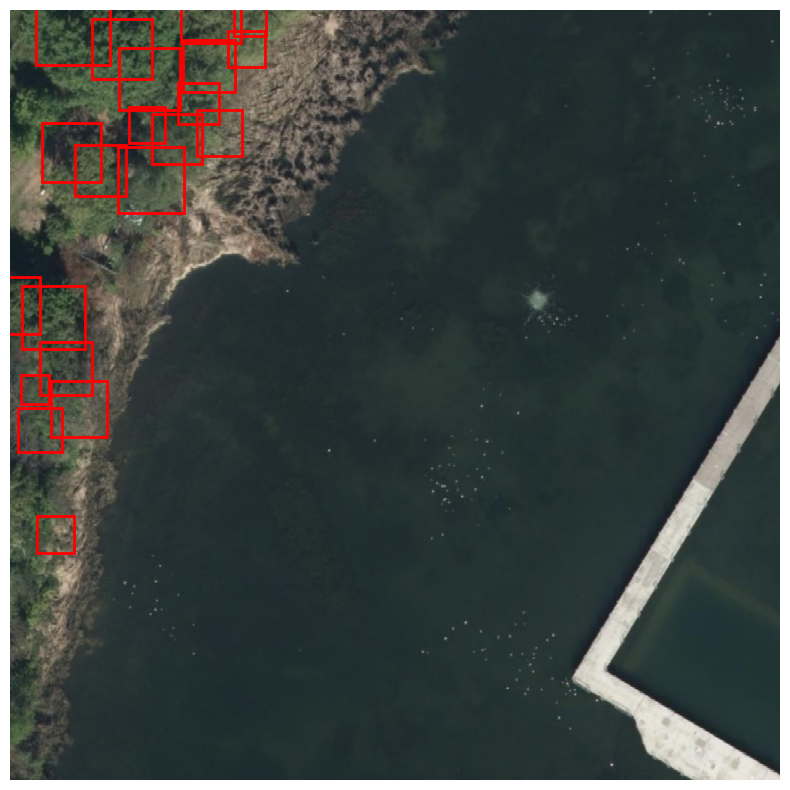

In [45]:
import matplotlib.pyplot as plt
import pytorch_lightning as pl

# Initialize the Lightning Data Module
data_module = TreesLightningDataModule(
    data=ds,
    batch_size=1,  # Fetch a single example for visualization
    train_fraction=0.8,
    transform=T.Compose(
        [
            T.ToTensor(),
            T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ]
    ),
    num_workers=0,
)

# Prepare and set up the data
data_module.prepare_data()
data_module.setup()

# Get the training dataloader
train_loader = data_module.train_dataloader()

# Fetch the first batch
for images, targets in train_loader:
    image = images[0]  # Single image
    target = targets[0]  # Corresponding target
    break

# Reverse normalization for visualization
# mean = torch.tensor([0.485, 0.456, 0.406])
# std = torch.tensor([0.229, 0.224, 0.225])
# image = T.ToTensor()(image)  # Convert PIL image to tensor
# image = image.permute(1, 2, 0) * std + mean  # HWC format, reverse normalization
# image = image.numpy()

# Display the image and bounding boxes
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis("off")
# print image it and show id from results ds

print(target["image_id"])

# Plot bounding boxes
boxes = target["boxes"]
for box in boxes:
    x_min, y_min, x_max, y_max = box.numpy()
    plt.gca().add_patch(
        plt.Rectangle(
            (x_min, y_min),
            x_max - x_min,
            y_max - y_min,
            fill=False,
            edgecolor="red",
            linewidth=2,
        )
    )

plt.show()

# Print the target dictionary

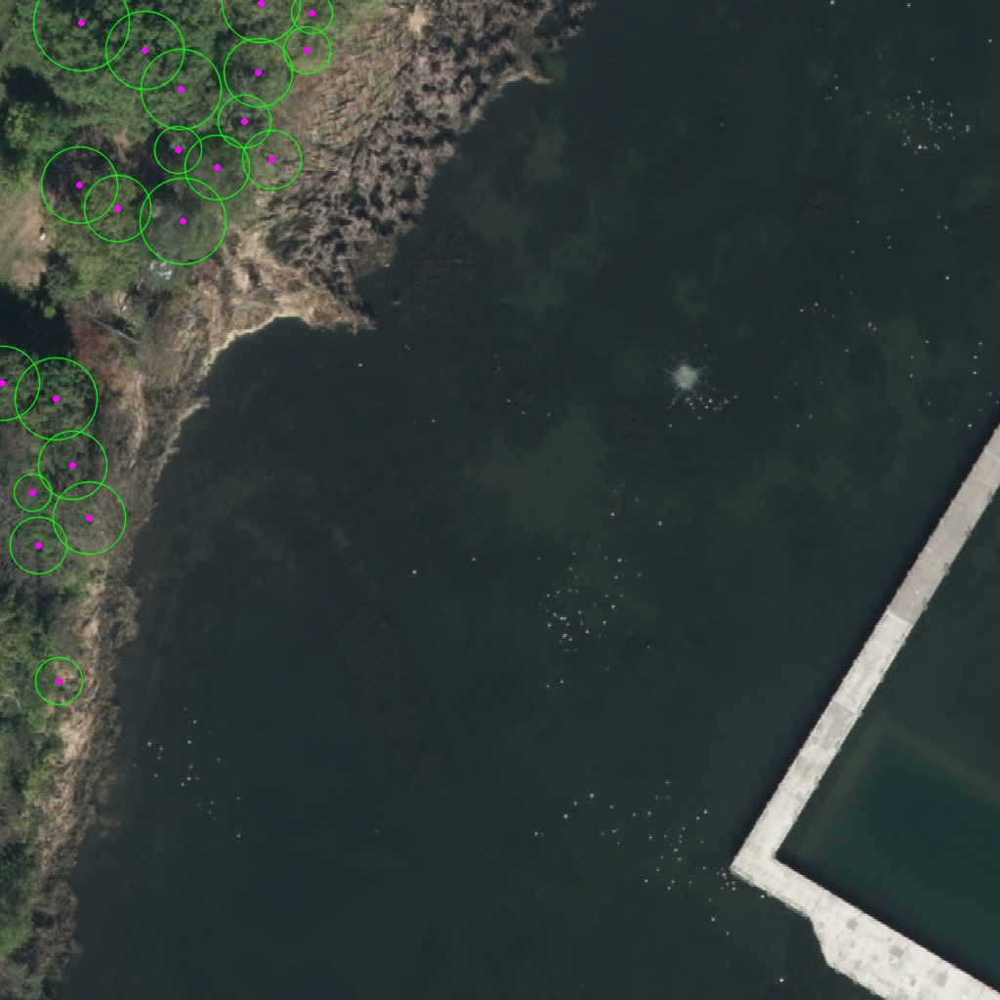

In [51]:
ds[target["image_id"].item()]["results"]

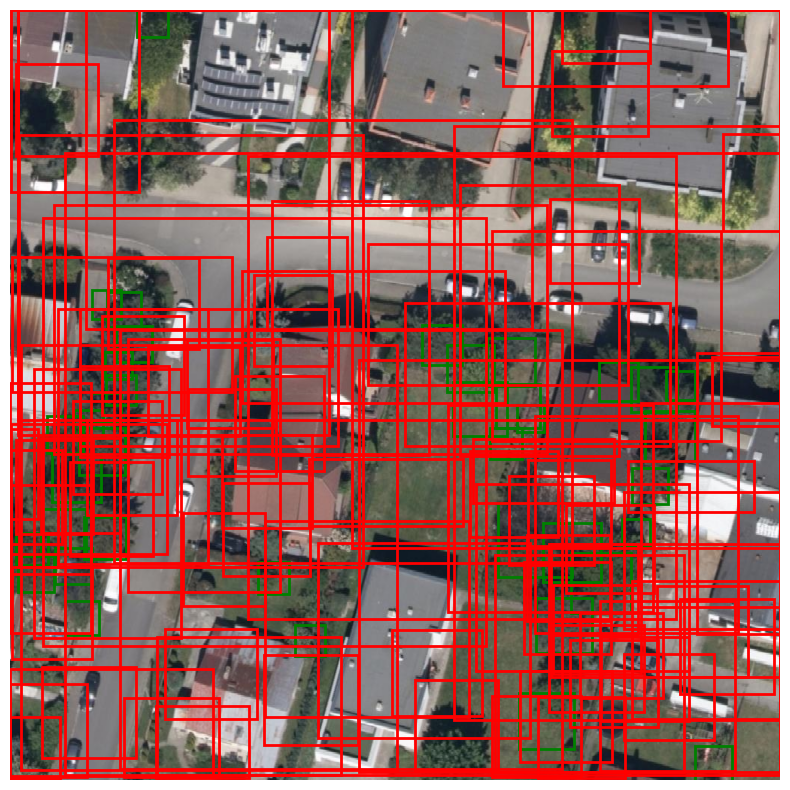

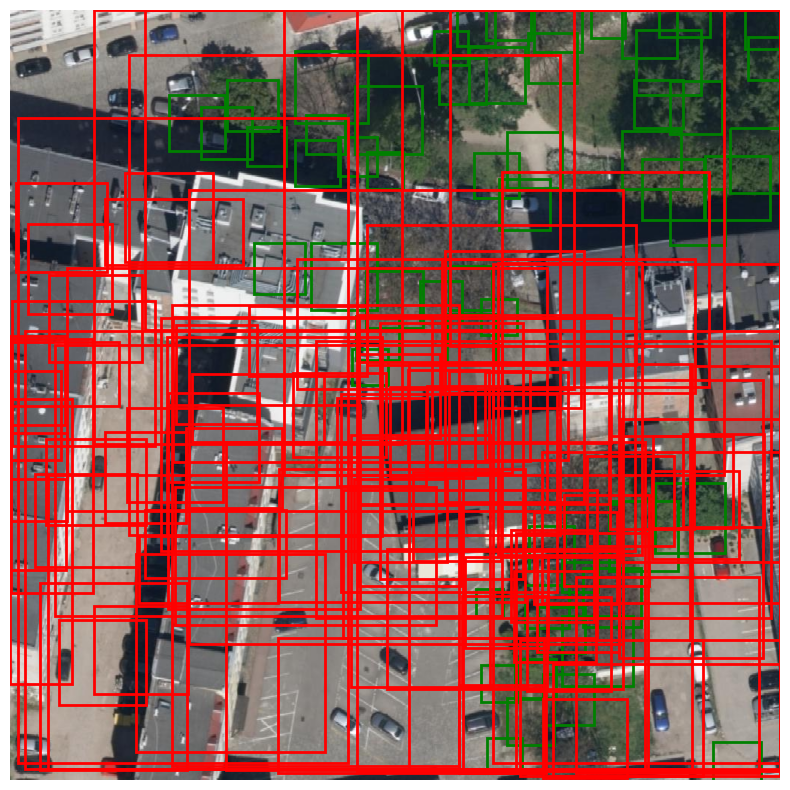

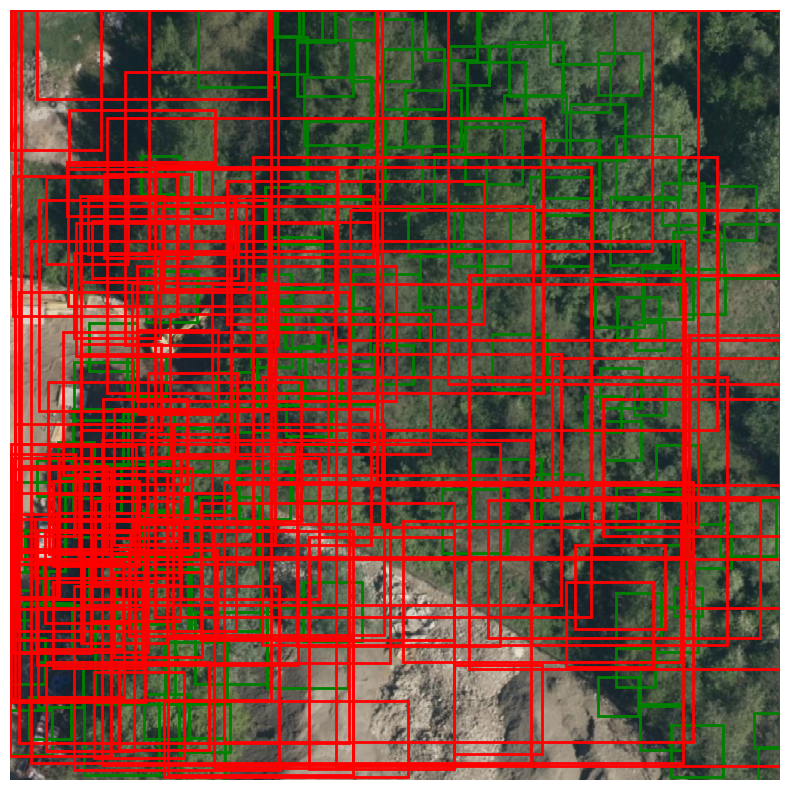

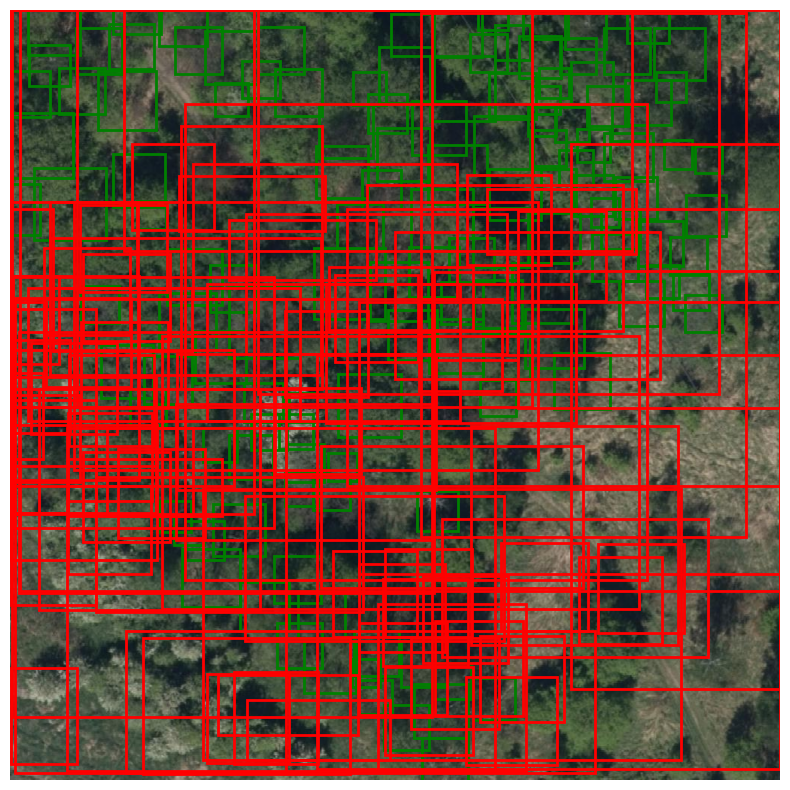

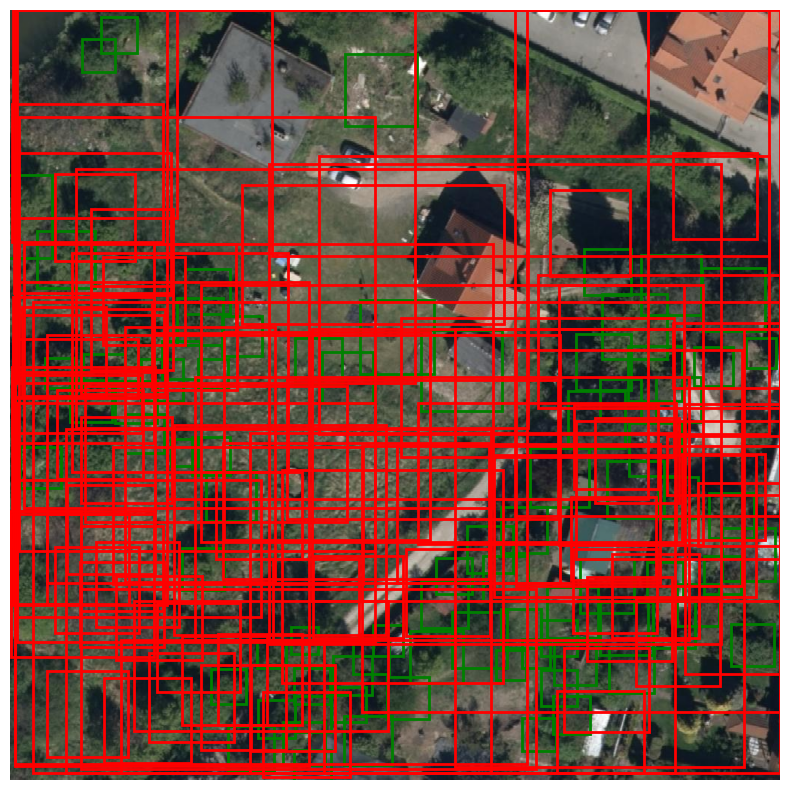

...

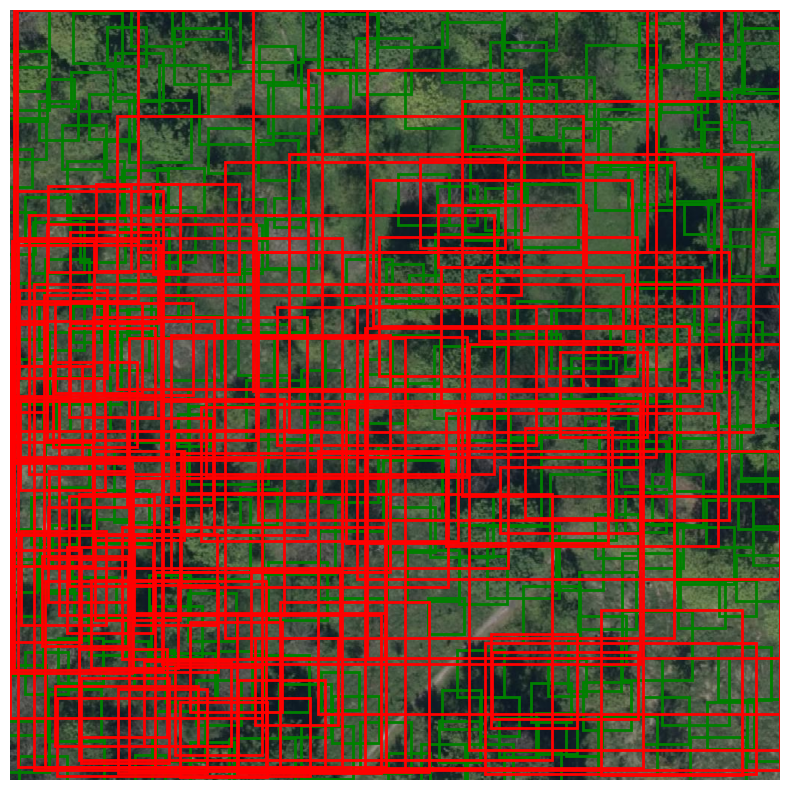

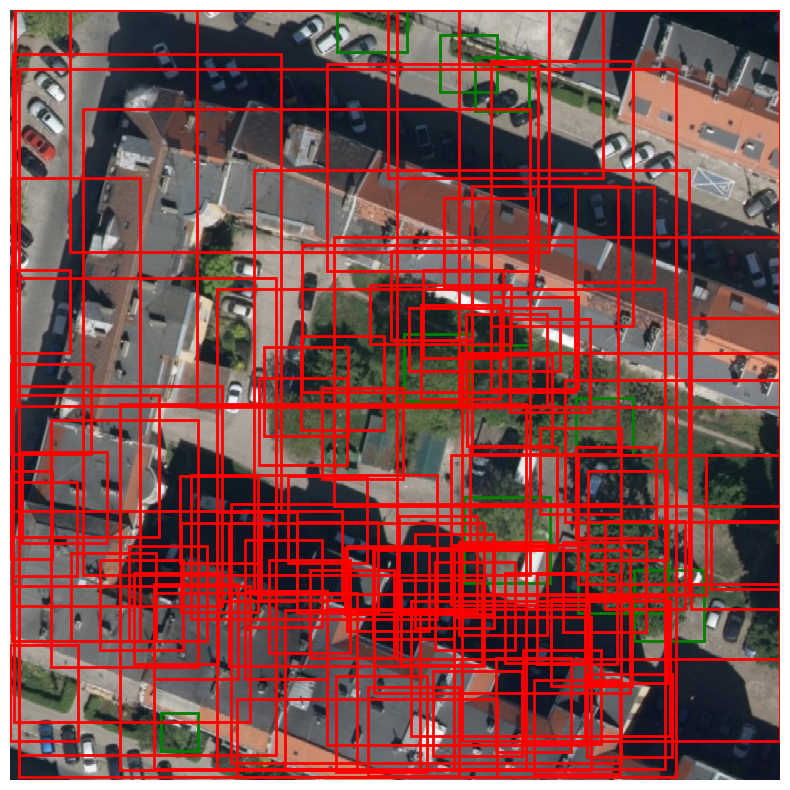

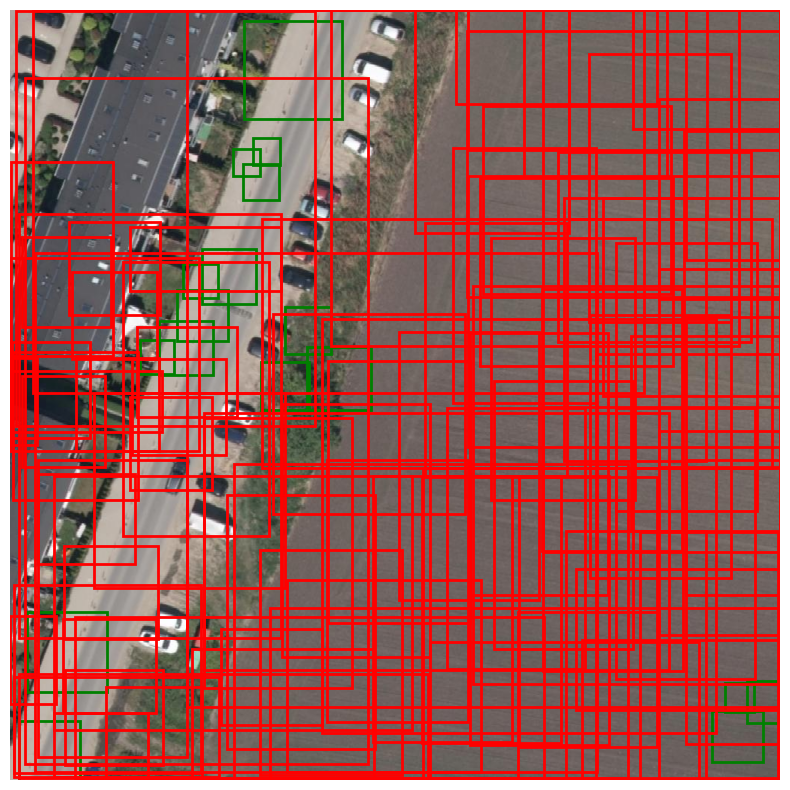

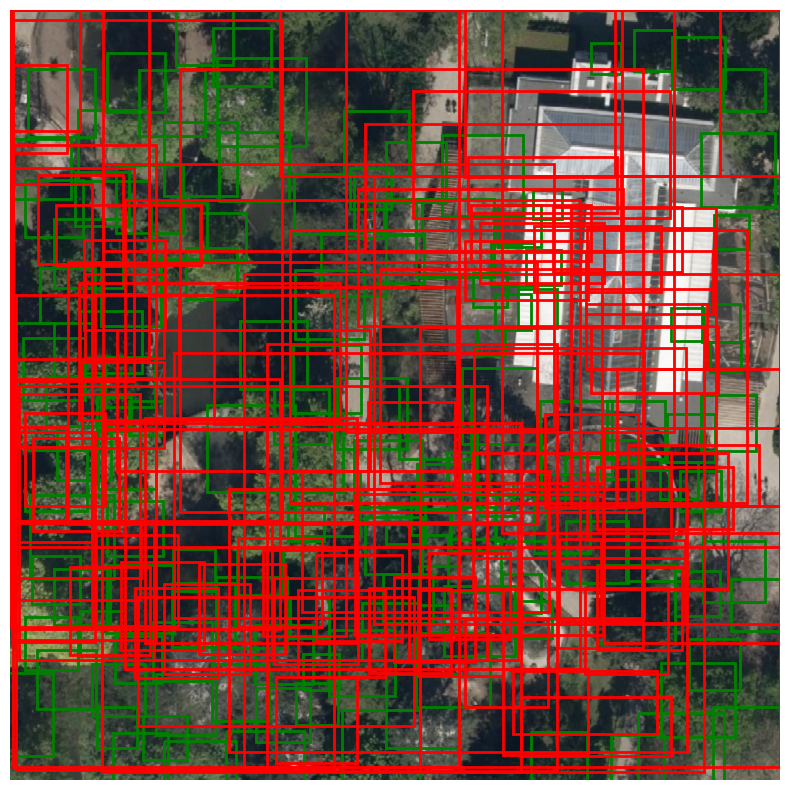

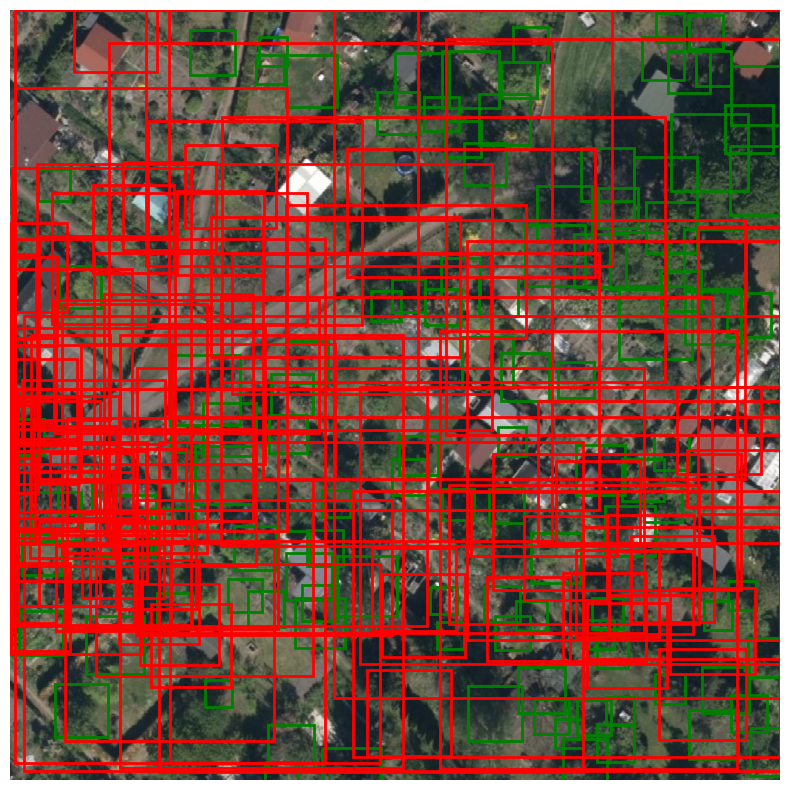

In [18]:
import matplotlib.pyplot as plt
import torchvision.transforms.functional as F

# Set the model to evaluation mode
model.eval()

# Move model to CPU
model.to("cpu")

# Fetch a batch of images and targets from the validation dataloader
val_loader = data_module.val_dataloader()
images, targets = next(iter(val_loader))

# Move images to the appropriate device
images = [image.to("cpu") for image in images]

# Get predictions from the model
with torch.no_grad():
    predictions = model(images)


# Function to plot bounding boxes
def plot_boxes(image, boxes, color):
    for box in boxes:
        x_min, y_min, x_max, y_max = box.cpu().numpy()
        plt.gca().add_patch(
            plt.Rectangle(
                (x_min, y_min),
                x_max - x_min,
                y_max - y_min,
                fill=False,
                edgecolor=color,
                linewidth=2,
            )
        )


# Function to invert normalization
def invert_normalization(image, mean, std):
    mean = torch.tensor(mean).view(3, 1, 1)
    std = torch.tensor(std).view(3, 1, 1)
    image = image * std + mean
    return image


# Mean and std used in normalization
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

# Plot the images with ground truth and predicted bounding boxes
for i, image in enumerate(images):
    plt.figure(figsize=(10, 10))
    image = invert_normalization(image, mean, std)
    plt.imshow(F.to_pil_image(image.cpu()))
    plt.axis("off")

    # Plot ground truth boxes in green
    plot_boxes(image, targets[i]["boxes"], "green")

    # Plot predicted boxes in red
    plot_boxes(image, predictions[i]["boxes"], "red")

    plt.show()